<a href="https://colab.research.google.com/github/gandhimonil9823/CS_GO_Analysis/blob/main/Smoke_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [24]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, f1_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn import model_selection
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans


In [2]:
from google.colab import drive
drive.mount('/content/drive')
#drive.mount(r'drive/folders/0AAxMXLC9WPNxUk9PVA')


Mounted at /content/drive


In [ ]:
ls

aggregated_data/  de_empire.png    de_royal.png      Log_ROC.png
cs_cruise.png     de_inferno.png   de_santorini.png  map_data.csv
damage_data.csv   de_mikla.png     de_season.png     meta_data.csv
de_cache.png      de_mirage.png    de_train.png      mm_grenades_demos.csv
de_cbble.png      de_new_nuke.png  de_tulip.png
de_coast.png      de_nuke.png      grenade_data.csv
de_dust2.png      de_overpass.png  kill_data.csv


In [3]:
cd 'drive/Shared drives/CS_GO_Data/processed_data_v2'

/content/drive/Shared drives/CS_GO_Data/processed_data_v2


In [4]:
ls

aggregated_data/  de_empire.png    de_royal.png      Log_ROC.png
cs_cruise.png     de_inferno.png   de_santorini.png  map_data.csv
damage_data.csv   de_mikla.png     de_season.png     meta_data.csv
de_cache.png      de_mirage.png    de_train.png      mm_grenades_demos.csv
de_cbble.png      de_new_nuke.png  de_tulip.png
de_coast.png      de_nuke.png      grenade_data.csv
de_dust2.png      de_overpass.png  kill_data.csv


# Smoke Plot for Maps and Attack_Sides (CT or T) 

In [5]:
# def pointx_to_resolutionx(xinput,startX=-3217,endX=1912,resX=1024):
def pointx_to_resolutionx(xinput,startX,endX,resX=1024):

    sizeX= endX-startX
    if startX < 0:
        xinput += startX *(-1.0)
    else:
        xinput += startX
    xoutput = float((xinput / abs(sizeX)) * resX);
    return xoutput

def pointy_to_resolutiony(yinput,startY,endY,resY=1024):
    sizeY=endY-startY
    if startY < 0:
        yinput += startY *(-1.0)
    else:
        yinput += startY
    youtput = float((yinput / abs(sizeY)) * resY);
    return resY-youtput


def plot_map_smoke(df_preprocessed_map_ct_t, map):
  im = plt.imread(map + ".png")
  print(map + ".png")
  plt.figure(figsize=(15,15))
  t = plt.imshow(im)
  # BLUE - Grenade Position
  t = plt.scatter(df_preprocessed_map_ct_t['nade_xpos'], df_preprocessed_map_ct_t['nade_ypos'],alpha=0.05,c='blue')

  # RED - throwing position
  t = plt.scatter(df_preprocessed_map_ct_t['thrower_xpos'], df_preprocessed_map_ct_t['thrower_ypos'],alpha=0.05,c='red')


def preprocess_data(df_grende_data, map, att_side):
  df_preprocessed_map_ct_t = df_grende_data.loc[((df_grende_data["nade"]== "Smoke") & (df_grende_data["map"]==map) & (df_grende_data["att_side"] == att_side))]

  # print(df_preprocessed_map_ct_t)

  df_preprocessed_map_ct_t = df_preprocessed_map_ct_t[[ 'nade_land_x', 'nade_land_y', 'att_rank', 'att_pos_x', 'att_pos_y']]

  df_preprocessed_map_ct_t = df_preprocessed_map_ct_t.dropna()

  return df_preprocessed_map_ct_t

# Function takes in a map and the att_side = Terr or Counterr
def smoke_map_t_ct(map, att_side):

  df_grende_data = pd.read_csv("mm_grenades_demos.csv")

  map_df = pd.read_csv('map_data.csv')
  map_df.rename(columns={'Unnamed: 0':'map'}, inplace=True)
  map_df.set_index('map', inplace=True)

  mp = map_df.loc[map]
  Start_X = [mp['StartX'], mp['EndX']]
  Start_Y = [mp['StartY'], mp['EndY']]

  df_preprocessed_map_ct_t = preprocess_data(df_grende_data, map, att_side)

  # convert x,y in game coordinates to coordinates on an image
  df_preprocessed_map_ct_t['thrower_xpos']=[pointx_to_resolutionx(row['att_pos_x'], Start_X[0], Start_X[1]) for index, row in df_preprocessed_map_ct_t.iterrows()]
  df_preprocessed_map_ct_t['thrower_ypos']= [pointy_to_resolutiony(row['att_pos_y'], Start_Y[0], Start_Y[1]) for index, row in df_preprocessed_map_ct_t.iterrows()]
  df_preprocessed_map_ct_t['nade_ypos'] = [pointy_to_resolutiony(row['nade_land_y'], Start_Y[0], Start_Y[1]) for index, row in df_preprocessed_map_ct_t.iterrows()]
  df_preprocessed_map_ct_t['nade_xpos'] = [pointx_to_resolutionx(row['nade_land_x'], Start_X[0], Start_X[1]) for index, row in df_preprocessed_map_ct_t.iterrows()]

  plot_map_smoke(df_preprocessed_map_ct_t, str(map))

  return df_preprocessed_map_ct_t


de_mirage.png


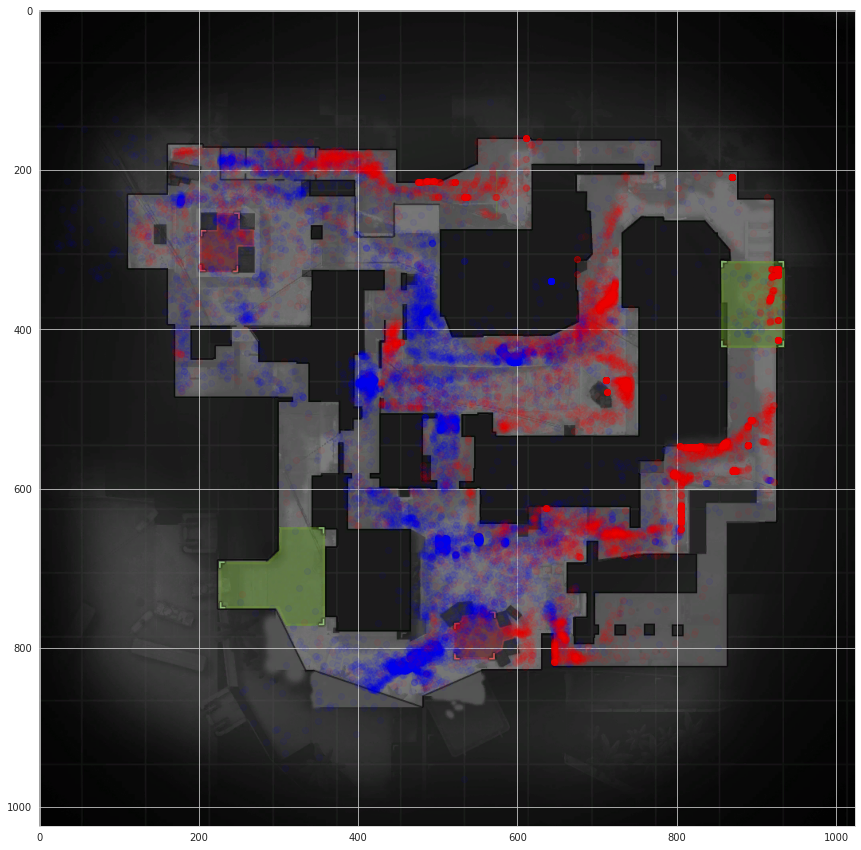

In [14]:

# map name and att_side = T or CT for all the maps in the map.csv
df_map_ct_t_values = smoke_map_t_ct("de_mirage", "Terrorist")

# Smoke Plot for Maps and Attack_Sides (CT or T) based on Density

In [19]:
def plot_density_based(df_map_ct_t_values, series_bollean_density, map):
  im = plt.imread(map)
  plt.figure(figsize=(12,12))
  implot = plt.imshow(im)
  implot = plt.scatter(df_map_ct_t_values['thrower_xpos'][series_bollean_density], df_map_ct_t_values['thrower_ypos'][series_bollean_density],alpha=0.15
                      ,c='red',s=5) 
  implot = plt.scatter(df_map_ct_t_values['nade_xpos'][series_bollean_density], df_map_ct_t_values['nade_ypos'][series_bollean_density],alpha=0.15
                      ,c='blue',s=5) 

def calc_N_Nearby(x,y,xarr,yarr,dt):
    index=[(xarr < (x + dt)) & (xarr > (x - dt)) & (yarr < (y + dt)) & (yarr > (y - dt))][0]
    return len(xarr[index])

density_based_values = []
def smoke_plot_density_based(df_map_ct_t_values, density_val, map):
  for index, row in df_map_ct_t_values.iterrows():
    thrower_xpos = row['thrower_xpos']
    thrower_ypos = row['thrower_ypos']
    return_value_den = calc_N_Nearby(thrower_xpos, thrower_ypos, df_map_ct_t_values['thrower_xpos'], df_map_ct_t_values['thrower_ypos'], density_val)
    density_based_values.append(return_value_den)

  df_map_ct_t_values['density'] = density_based_values

  series_bollean_density =[(df_map_ct_t_values['density'] > 100)][0]

  plot_density_based(df_map_ct_t_values, series_bollean_density, map)

  return df_map_ct_t_values




,nade_land_x,nade_land_y,att_rank,att_pos_x,att_pos_y,thrower_xpos,thrower_ypos,nade_ypos,nade_xpos,density
1683,-792.502800,-851.0277,16,269.97130,-221.03180,696.170523,383.376857,510.293206,484.048573,250
1684,-798.543500,-896.3890,13,292.34250,-298.51790,700.636912,398.986884,519.431504,482.842553,152
1687,-6.300833,-1540.7100,15,1152.81300,-1169.75500,872.429033,574.502680,649.233728,641.013053,1218
1688,-662.862400,531.9008,16,-405.66610,432.13960,561.280155,251.791668,231.694193,509.931157,24
1690,-672.922100,-1304.0330,13,-496.51080,-1357.29700,543.143096,612.284109,601.553766,507.922747,32
...,...,...,...,...,...,...,...,...,...,...
364998,-1562.804000,671.7926,11,-1453.36700,668.77120,352.107661,204.120852,203.512173,330.258667,100
365033,-1482.800000,760.8912,11,-1326.28600,814.22670,377.479262,174.817993,185.562741,346.231390,174
365074,-155.836900,-1686.6630,11,84.51003,-2372.28600,659.143356,816.759564,678.636811,611.158318,229
365079,192.870700,-267.7387,0,222.73180,-81.71589,686.739201,355.310854,392.786234,680.777461,82


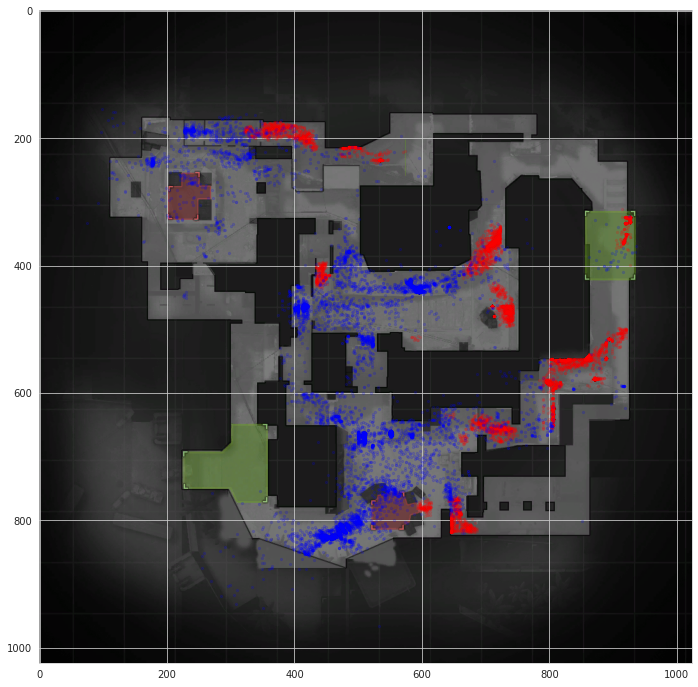

In [20]:
df_density_based_plot_values = smoke_plot_density_based(df_map_ct_t_values, 15, "de_mirage.png")

df_density_based_plot_values

# K Means Clustering on the Smoke Plot

In [34]:
def fit_k_means(df_density_based_plot_values, map):
  kmeans = KMeans(n_clusters=25) 
  series_bollean_density =[(df_density_based_plot_values['density'] > 100)][0]
  kmeans.fit(df_density_based_plot_values[["thrower_xpos","thrower_ypos"]][series_bollean_density])
  c_centers=pd.DataFrame(kmeans.cluster_centers_)
  plot_centers_clusters(df_density_based_plot_values, c_centers, series_bollean_density, map)
  return kmeans


def plot_centers_clusters(df_density_based_plot_values, c_centers, series_bollean_density, map):
  im = plt.imread(map)
  plt.figure(figsize=(12,12))
  implot = plt.imshow(im)
  implot = plt.scatter(df_density_based_plot_values['thrower_xpos'][series_bollean_density], df_density_based_plot_values['thrower_ypos'][series_bollean_density],alpha=0.25, c='red',s=5) 
  implot = plt.scatter(df_density_based_plot_values['nade_xpos'][series_bollean_density], df_density_based_plot_values['nade_ypos'][series_bollean_density],alpha=0.25, c='blue',s=5) 
  implot = plt.scatter(c_centers[0],c_centers[1],alpha=1.0, c='white',s=35)


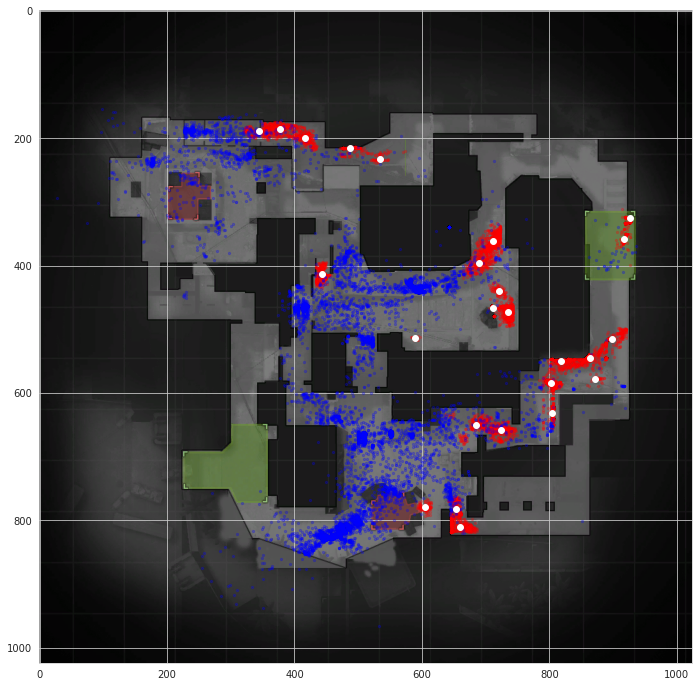

In [35]:
# For calling fit_k_means provide the previous run dataframe with the density column and a map name 
kmeans = fit_k_means(df_density_based_plot_values, "de_mirage.png")

# Cluster Plot for the label values of the Clusters

In [40]:
def return_df_unlabel_data(df_density_based_plot_values, kmeans):
  series_bollean_density =[(df_density_based_plot_values['density'] > 100)][0]
  df_density_based_plot_values['kmeanslabel']=np.zeros(len(series_bollean_density))
  df_density_based_plot_values['kmeanslabel'][series_bollean_density]=kmeans.labels_
  return df_density_based_plot_values

def plot_individual_clusters(df_density_based_plot_values ,map, range_cluster):
  for i in range(1,range_cluster):
    index=[df_density_based_plot_values['kmeanslabel'] == i][0]
    im = plt.imread(map)
    plt.figure(figsize=(12,12))
    implot = plt.imshow(im)
    implot = plt.scatter(df_density_based_plot_values['thrower_xpos'][index], df_density_based_plot_values['thrower_ypos'][index],alpha=0.25
                         ,c='red',s=5) 
    implot = plt.scatter(df_density_based_plot_values['nade_xpos'][index], df_density_based_plot_values['nade_ypos'][index],alpha=0.25
                         ,c='blue',s=5)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To contr

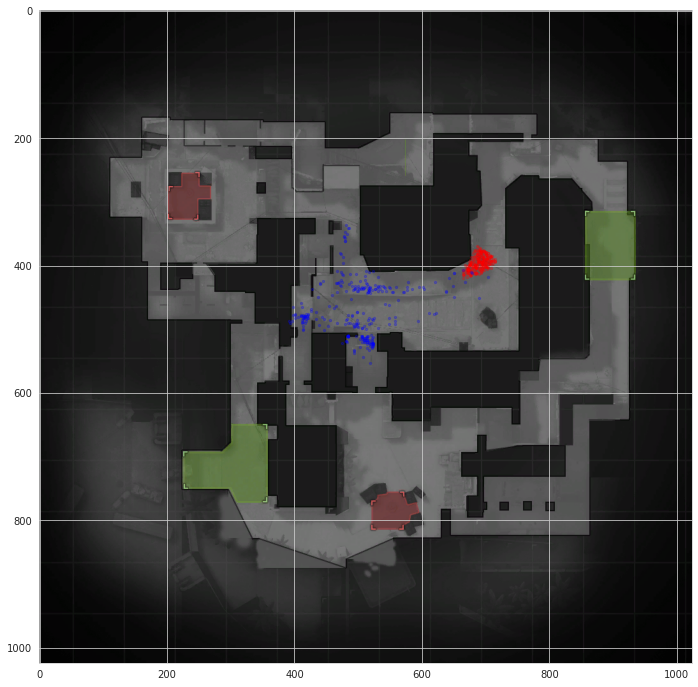

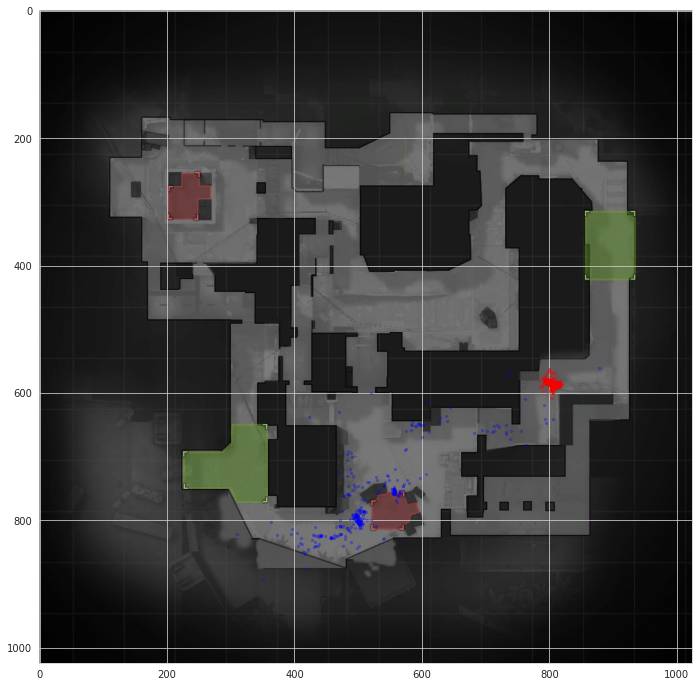

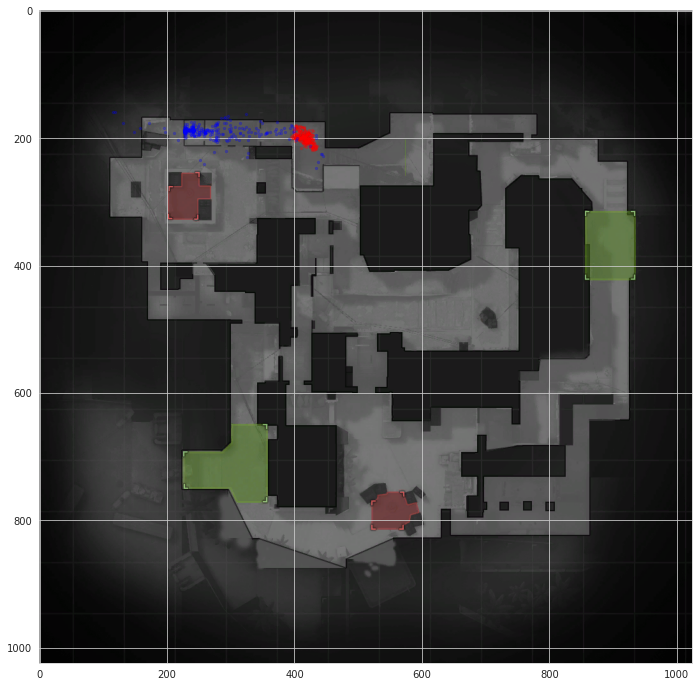

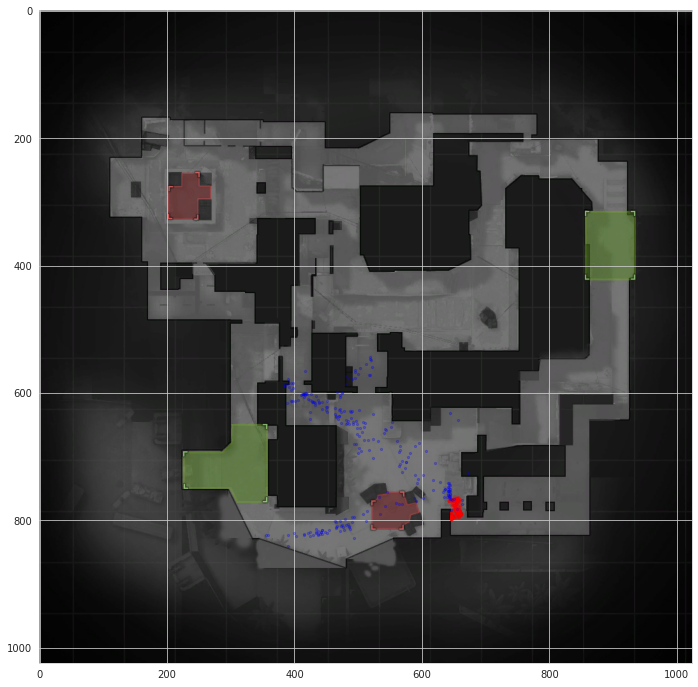

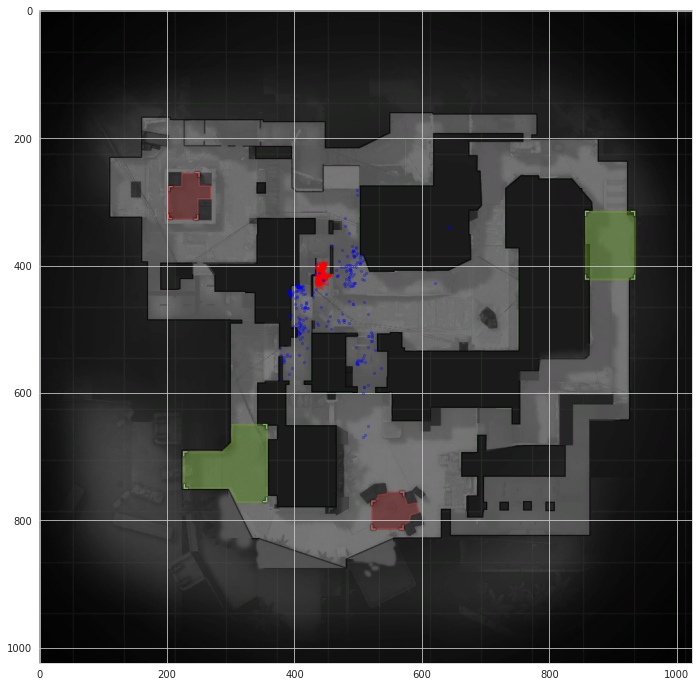

...

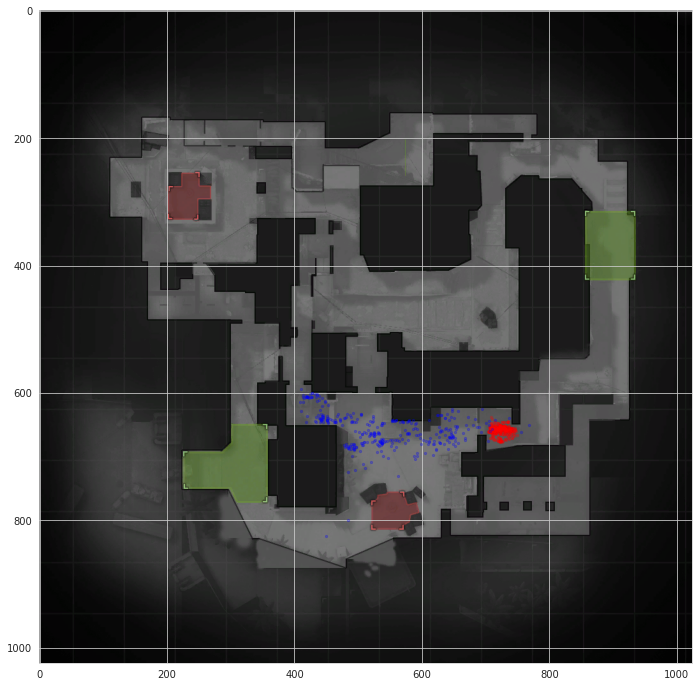

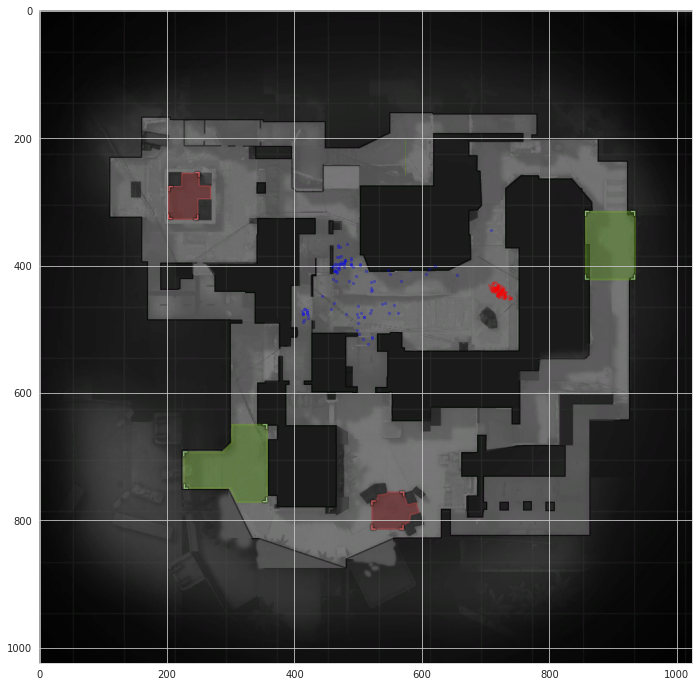

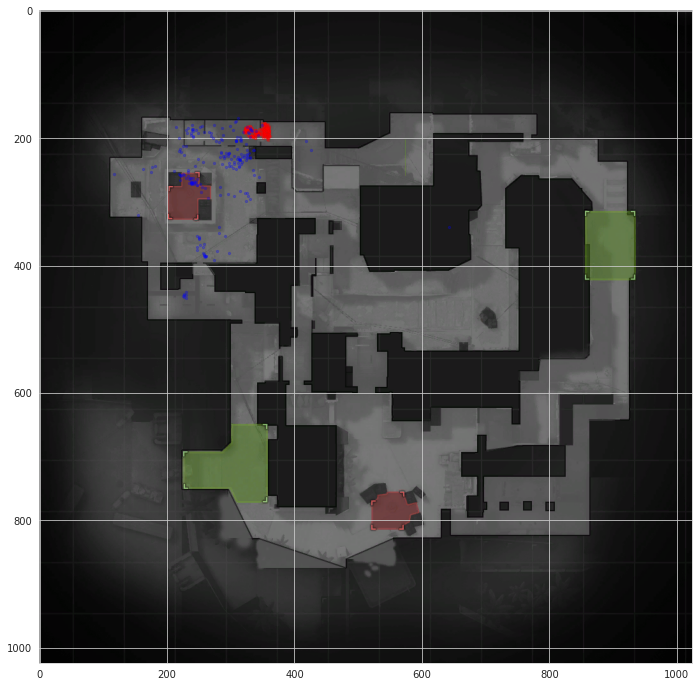

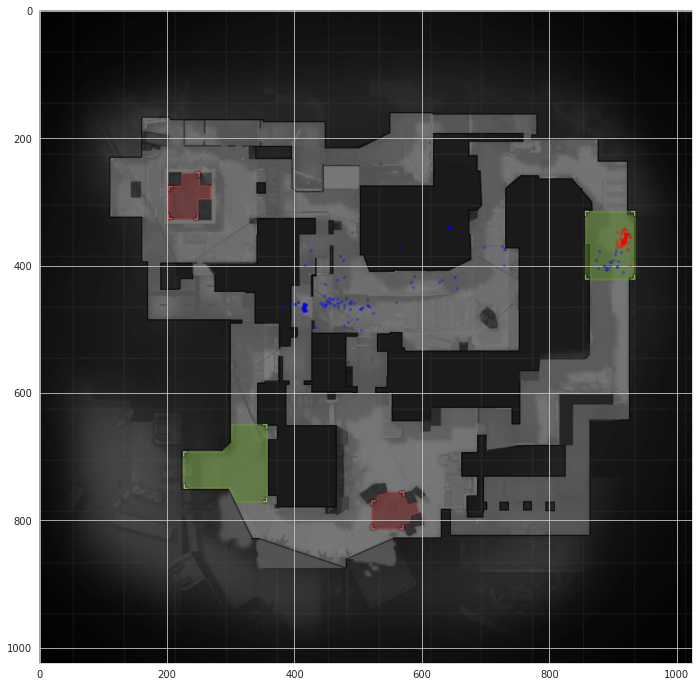

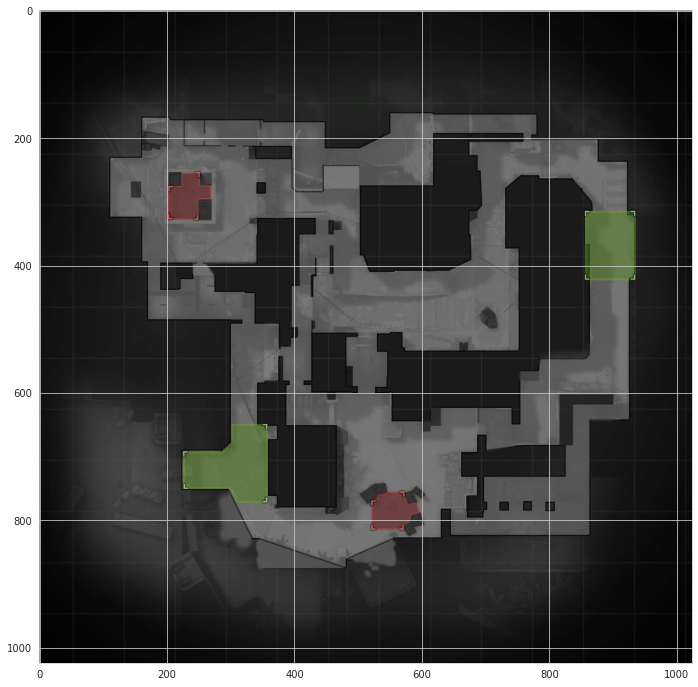

In [43]:
# return_df_unlabel_data takes the same dataframe and the fit kmean model
df_labled_data_df = return_df_unlabel_data(df_density_based_plot_values, kmeans)

# Plot takes it the new labelled data, map and the number of plots for the label clusters which the user wants to see
plot_individual_clusters(df_labled_data_df, 'de_mirage.png', 26)
